In [ ]:
# @title Licensed under the MIT License

# Copyright (c) 2021 Katherine Crowson

# Permission is hereby granted, free of charge, to any person obtaining a copy
# of this software and associated documentation files (the "Software"), to deal
# in the Software without restriction, including without limitation the rights
# to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
# copies of the Software, and to permit persons to whom the Software is
# furnished to do so, subject to the following conditions:

# The above copyright notice and this permission notice shall be included in
# all copies or substantial portions of the Software.

# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
# AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
# OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN
# THE SOFTWARE.

In [ ]:
# Check the GPU type

!nvidia-smi

Fri Jun 13 13:16:28 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   72C    P0             32W /   70W |    2320MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
# Imports

from contextlib import contextmanager
from copy import deepcopy
import math

from IPython import display
from matplotlib import pyplot as plt
import torch
from torch import optim, nn
from torch.nn import functional as F
from torch.utils import data
from torchvision import datasets, transforms, utils
from torchvision.transforms import functional as TF
from tqdm.notebook import tqdm, trange


In [ ]:
# Utilities

@contextmanager
def train_mode(model, mode=True):
    """A context manager that places a model into training mode and restores
    the previous mode on exit."""
    modes = [module.training for module in model.modules()]
    try:
        yield model.train(mode)
    finally:
        for i, module in enumerate(model.modules()):
            module.training = modes[i]


def eval_mode(model):
    """A context manager that places a model into evaluation mode and restores
    the previous mode on exit."""
    return train_mode(model, False)


@torch.no_grad()
def ema_update(model, averaged_model, decay):
    """Incorporates updated model parameters into an exponential moving averaged
    version of a model. It should be called after each optimizer step."""
    model_params = dict(model.named_parameters())
    averaged_params = dict(averaged_model.named_parameters())
    assert model_params.keys() == averaged_params.keys()

    for name, param in model_params.items():
        averaged_params[name].mul_(decay).add_(param, alpha=1 - decay)

    model_buffers = dict(model.named_buffers())
    averaged_buffers = dict(averaged_model.named_buffers())
    assert model_buffers.keys() == averaged_buffers.keys()

    for name, buf in model_buffers.items():
        averaged_buffers[name].copy_(buf)


In [ ]:
# Define the model (a residual U-Net)

class ResidualBlock(nn.Module):
    def __init__(self, main, skip=None):
        super().__init__()
        self.main = nn.Sequential(*main)
        self.skip = skip if skip else nn.Identity()

    def forward(self, input):
        return self.main(input) + self.skip(input)


class ResConvBlock(ResidualBlock):
    def __init__(self, c_in, c_mid, c_out, dropout_last=True):
        skip = None if c_in == c_out else nn.Conv2d(c_in, c_out, 1, bias=False)
        super().__init__([
            nn.Conv2d(c_in, c_mid, 3, padding=1),
            nn.Dropout2d(0.1, inplace=True),
            nn.ReLU(inplace=True),
            nn.Conv2d(c_mid, c_out, 3, padding=1),
            nn.Dropout2d(0.1, inplace=True) if dropout_last else nn.Identity(),
            nn.ReLU(inplace=True),
        ], skip)


class SkipBlock(nn.Module):
    def __init__(self, main, skip=None):
        super().__init__()
        self.main = nn.Sequential(*main)
        self.skip = skip if skip else nn.Identity()

    def forward(self, input):
        return torch.cat([self.main(input), self.skip(input)], dim=1)


class FourierFeatures(nn.Module):
    def __init__(self, in_features, out_features, std=1.):
        super().__init__()
        assert out_features % 2 == 0
        self.weight = nn.Parameter(torch.randn([out_features // 2, in_features]) * std)

    def forward(self, input):
        f = 2 * math.pi * input @ self.weight.T
        return torch.cat([f.cos(), f.sin()], dim=-1)


def expand_to_planes(input, shape):
    return input[..., None, None].repeat([1, 1, shape[2], shape[3]])


class Diffusion(nn.Module):
    def __init__(self):
        super().__init__()
        c = 64  # The base channel count

        # The inputs to timestep_embed will approximately fall into the range
        # -10 to 10, so use std 0.2 for the Fourier Features.
        self.timestep_embed = FourierFeatures(1, 16, std=0.2)
        self.class_embed = nn.Embedding(10, 4)

        self.net = nn.Sequential(   # 32x32
            ResConvBlock(3 + 16 + 4, c, c),
            ResConvBlock(c, c, c),
            SkipBlock([
                nn.AvgPool2d(2),  # 32x32 -> 16x16
                ResConvBlock(c, c * 2, c * 2),
                ResConvBlock(c * 2, c * 2, c * 2),
                SkipBlock([
                    nn.AvgPool2d(2),  # 16x16 -> 8x8
                    ResConvBlock(c * 2, c * 4, c * 4),
                    ResConvBlock(c * 4, c * 4, c * 4),
                    SkipBlock([
                        nn.AvgPool2d(2),  # 8x8 -> 4x4
                        ResConvBlock(c * 4, c * 8, c * 8),
                        ResConvBlock(c * 8, c * 8, c * 8),
                        ResConvBlock(c * 8, c * 8, c * 8),
                        ResConvBlock(c * 8, c * 8, c * 4),
                        nn.Upsample(scale_factor=2),
                    ]),  # 4x4 -> 8x8
                    ResConvBlock(c * 8, c * 4, c * 4),
                    ResConvBlock(c * 4, c * 4, c * 2),
                    nn.Upsample(scale_factor=2),
                ]),  # 8x8 -> 16x16
                ResConvBlock(c * 4, c * 2, c * 2),
                ResConvBlock(c * 2, c * 2, c),
                nn.Upsample(scale_factor=2),
            ]),  # 16x16 -> 32x32
            ResConvBlock(c * 2, c, c),
            ResConvBlock(c, c, 3, dropout_last=False),
        )

    def forward(self, input, log_snrs, cond):
        timestep_embed = expand_to_planes(self.timestep_embed(log_snrs[:, None]), input.shape)
        class_embed = expand_to_planes(self.class_embed(cond), input.shape)
        return self.net(torch.cat([input, class_embed, timestep_embed], dim=1))


In [ ]:
# Define the noise schedule and sampling loop

def get_alphas_sigmas(log_snrs):
    """Returns the scaling factors for the clean image (alpha) and for the
    noise (sigma), given the log SNR for a timestep."""
    return log_snrs.sigmoid().sqrt(), log_snrs.neg().sigmoid().sqrt()


def get_ddpm_schedule(t):
    """Returns log SNRs for the noise schedule from the DDPM paper."""
    return -torch.special.expm1(1e-4 + 10 * t**2).log()


@torch.no_grad()
def sample(model, x, steps, eta, classes, mask_param=None):
    ts = x.new_ones([x.shape[0]])
    t = torch.linspace(1, 0, steps + 1)[:-1]
    log_snrs = get_ddpm_schedule(t)
    alphas, sigmas = get_alphas_sigmas(log_snrs)

    for i in trange(steps):
        with torch.cuda.amp.autocast():
            v = model(x, ts * log_snrs[i], classes).float()

        pred = x * alphas[i] - v * sigmas[i]
        eps = x * sigmas[i] + v * alphas[i]

        if i < steps - 1:
            ddim_sigma = eta * (sigmas[i + 1]**2 / sigmas[i]**2).sqrt() * \
                         (1 - alphas[i]**2 / alphas[i + 1]**2).sqrt()
            adjusted_sigma = (sigmas[i + 1]**2 - ddim_sigma**2).sqrt()

            x = pred * alphas[i + 1] + eps * adjusted_sigma

            if eta:
                noise = torch.randn_like(x)

                if mask_param is not None:
                    # Frequency domain masking
                    noise_freq = torch.fft.fft2(noise, norm='ortho')
                    mask = mask_param.expand_as(noise_freq).to(noise.device)
                    noise_freq_masked = noise_freq * mask
                    noise = torch.fft.ifft2(noise_freq_masked, norm='ortho').real

                x += noise * ddim_sigma

    return pred



In [ ]:
# Prepare the dataset

batch_size = 100

tf = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5]),
])
train_set = datasets.CIFAR10('data', train=True, download=True, transform=tf)
train_dl = data.DataLoader(train_set, batch_size, shuffle=True,
                           num_workers=2, persistent_workers=True, pin_memory=True)
val_set = datasets.CIFAR10('data', train=False, download=True, transform=tf)
val_dl = data.DataLoader(val_set, batch_size,
                         num_workers=2, persistent_workers=True, pin_memory=True)


In [ ]:
from copy import deepcopy
import torch.optim as optim

seed = 0
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
torch.manual_seed(seed)

# Diffusion model
model = Diffusion().to(device)
model_ema = deepcopy(model)
print('Model parameters:', sum(p.numel() for p in model.parameters()))

# Time-independent learnable frequency mask
mask_param = nn.Parameter(torch.full((1, 1, 32, 32), 0.5) + 0.01 * torch.randn(1, 1, 32, 32))


# Optimizer: model + mask
opt = optim.Adam([
    {'params': model.parameters()},
    {'params': [mask_param], 'lr': 3e-5}
], lr=2e-4)


scaler = torch.cuda.amp.GradScaler()
epoch = 0

# Quasi-random timestep sampler
rng = torch.quasirandom.SobolEngine(1, scramble=True)


Using device: cuda
Model parameters: 23211315


<ipython-input-29-3601763087>:25: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()



Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

<ipython-input-30-547166541>:42: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Validation: Epoch: 0, loss: 0.22374

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

<ipython-input-27-399176926>:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


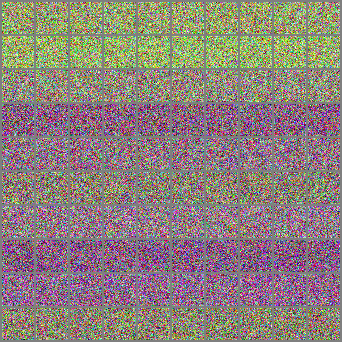

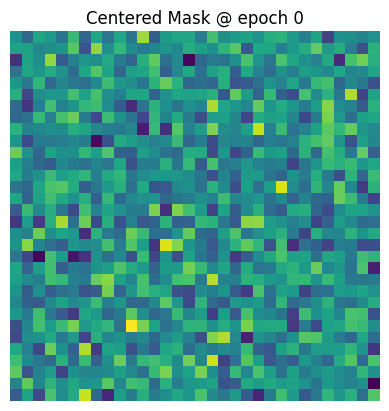

Epoch 0


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 0, iteration: 0, loss: 0.220742
Epoch: 0, iteration: 50, loss: 0.141849
Epoch: 0, iteration: 100, loss: 0.0782821
Epoch: 0, iteration: 150, loss: 0.0753025
Epoch: 0, iteration: 200, loss: 0.0685569
Epoch: 0, iteration: 250, loss: 0.0749297
Epoch: 0, iteration: 300, loss: 0.0686801
Epoch: 0, iteration: 350, loss: 0.0640605
Epoch: 0, iteration: 400, loss: 0.0674692
Epoch: 0, iteration: 450, loss: 0.0669643

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 1, loss: 0.0604687

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

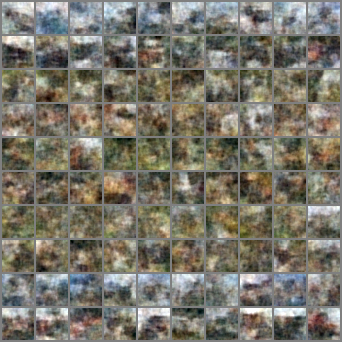

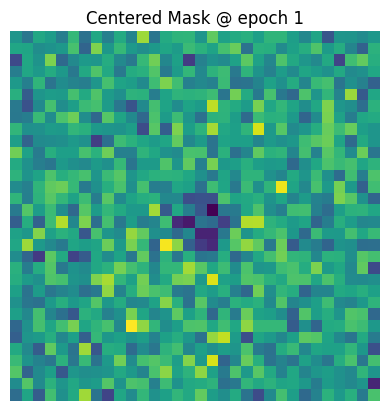

Epoch 1


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 1, iteration: 0, loss: 0.0649806
Epoch: 1, iteration: 50, loss: 0.0654048
Epoch: 1, iteration: 100, loss: 0.0658647
Epoch: 1, iteration: 150, loss: 0.0638338
Epoch: 1, iteration: 200, loss: 0.0640207
Epoch: 1, iteration: 250, loss: 0.053453
Epoch: 1, iteration: 300, loss: 0.0546369
Epoch: 1, iteration: 350, loss: 0.0621459
Epoch: 1, iteration: 400, loss: 0.052601
Epoch: 1, iteration: 450, loss: 0.0541519

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 2, loss: 0.0528308

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

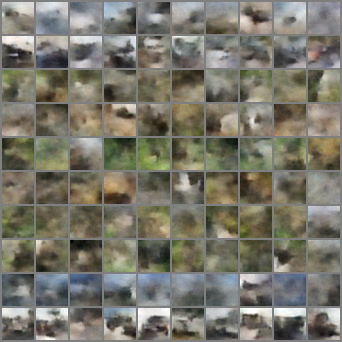

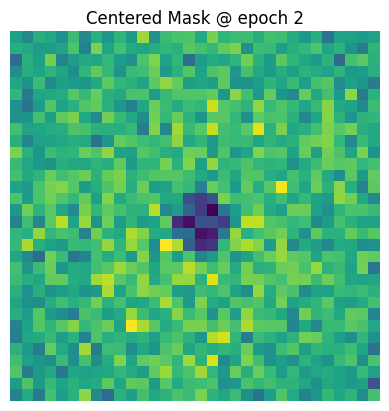

Epoch 2


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 2, iteration: 0, loss: 0.0513538
Epoch: 2, iteration: 50, loss: 0.0607371
Epoch: 2, iteration: 100, loss: 0.0593838
Epoch: 2, iteration: 150, loss: 0.0575943
Epoch: 2, iteration: 200, loss: 0.0547107
Epoch: 2, iteration: 250, loss: 0.0587409
Epoch: 2, iteration: 300, loss: 0.0537412
Epoch: 2, iteration: 350, loss: 0.0579663
Epoch: 2, iteration: 400, loss: 0.0482489
Epoch: 2, iteration: 450, loss: 0.0608501
Epoch 3


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 3, iteration: 0, loss: 0.055731
Epoch: 3, iteration: 50, loss: 0.050376
Epoch: 3, iteration: 100, loss: 0.0541683
Epoch: 3, iteration: 150, loss: 0.0521988
Epoch: 3, iteration: 200, loss: 0.0490859
Epoch: 3, iteration: 250, loss: 0.0487086
Epoch: 3, iteration: 300, loss: 0.0466659
Epoch: 3, iteration: 350, loss: 0.0523204
Epoch: 3, iteration: 400, loss: 0.0611629
Epoch: 3, iteration: 450, loss: 0.0538735

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 4, loss: 0.0476675

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

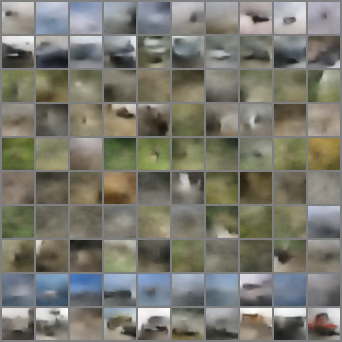

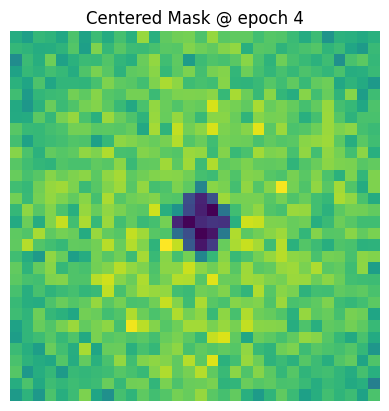

Epoch 4


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 4, iteration: 0, loss: 0.0510317
Epoch: 4, iteration: 50, loss: 0.0522904
Epoch: 4, iteration: 100, loss: 0.0498689
Epoch: 4, iteration: 150, loss: 0.0507523
Epoch: 4, iteration: 200, loss: 0.054912
Epoch: 4, iteration: 250, loss: 0.0498725
Epoch: 4, iteration: 300, loss: 0.0528381
Epoch: 4, iteration: 350, loss: 0.044151
Epoch: 4, iteration: 400, loss: 0.0525331
Epoch: 4, iteration: 450, loss: 0.0509128
Epoch 5


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 5, iteration: 0, loss: 0.0457708
Epoch: 5, iteration: 50, loss: 0.0521176
Epoch: 5, iteration: 100, loss: 0.0461063
Epoch: 5, iteration: 150, loss: 0.0565835
Epoch: 5, iteration: 200, loss: 0.0495022
Epoch: 5, iteration: 250, loss: 0.058837
Epoch: 5, iteration: 300, loss: 0.0513043
Epoch: 5, iteration: 350, loss: 0.0552628
Epoch: 5, iteration: 400, loss: 0.0486201
Epoch: 5, iteration: 450, loss: 0.0483123

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 6, loss: 0.0455521

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

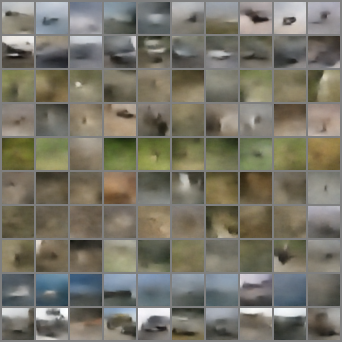

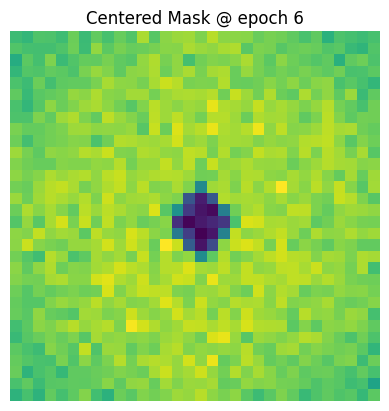

Epoch 6


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 6, iteration: 0, loss: 0.0419188
Epoch: 6, iteration: 50, loss: 0.0534218
Epoch: 6, iteration: 100, loss: 0.0455011
Epoch: 6, iteration: 150, loss: 0.0513615
Epoch: 6, iteration: 200, loss: 0.0427023
Epoch: 6, iteration: 250, loss: 0.0523391
Epoch: 6, iteration: 300, loss: 0.043781
Epoch: 6, iteration: 350, loss: 0.0462917
Epoch: 6, iteration: 400, loss: 0.0461138
Epoch: 6, iteration: 450, loss: 0.0480362
Epoch 7


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 7, iteration: 0, loss: 0.0480444
Epoch: 7, iteration: 50, loss: 0.0488324
Epoch: 7, iteration: 100, loss: 0.0464158
Epoch: 7, iteration: 150, loss: 0.0494789
Epoch: 7, iteration: 200, loss: 0.0479701
Epoch: 7, iteration: 250, loss: 0.0503366
Epoch: 7, iteration: 300, loss: 0.0481323
Epoch: 7, iteration: 350, loss: 0.0560496
Epoch: 7, iteration: 400, loss: 0.0502783
Epoch: 7, iteration: 450, loss: 0.0438128

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 8, loss: 0.0443345

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

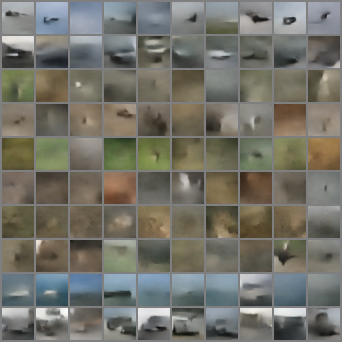

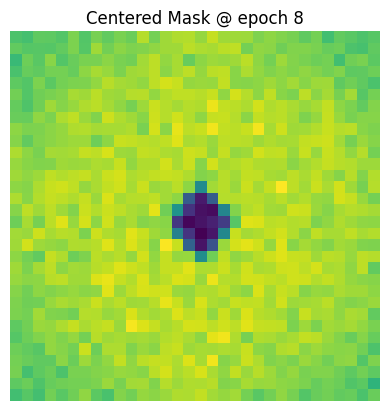

Epoch 8


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 8, iteration: 0, loss: 0.0455849
Epoch: 8, iteration: 50, loss: 0.0414331
Epoch: 8, iteration: 100, loss: 0.0371846
Epoch: 8, iteration: 150, loss: 0.0461996
Epoch: 8, iteration: 200, loss: 0.0434666
Epoch: 8, iteration: 250, loss: 0.0528966
Epoch: 8, iteration: 300, loss: 0.0426242
Epoch: 8, iteration: 350, loss: 0.0480087
Epoch: 8, iteration: 400, loss: 0.0471795
Epoch: 8, iteration: 450, loss: 0.0492917
Epoch 9


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 9, iteration: 0, loss: 0.0402573
Epoch: 9, iteration: 50, loss: 0.0506232
Epoch: 9, iteration: 100, loss: 0.0420139
Epoch: 9, iteration: 150, loss: 0.0485297
Epoch: 9, iteration: 200, loss: 0.0464021
Epoch: 9, iteration: 250, loss: 0.0441226
Epoch: 9, iteration: 300, loss: 0.0407743
Epoch: 9, iteration: 350, loss: 0.0483944
Epoch: 9, iteration: 400, loss: 0.0436042
Epoch: 9, iteration: 450, loss: 0.0424323

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 10, loss: 0.0433632

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

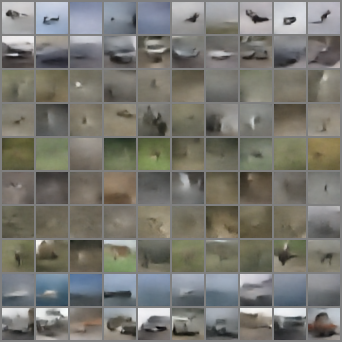

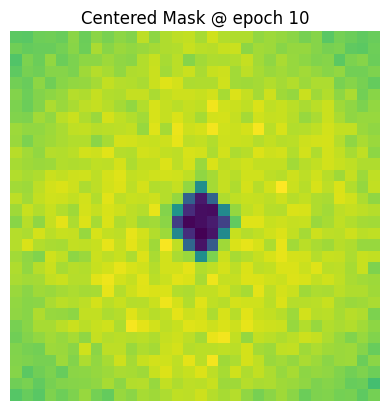

Epoch 10


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 10, iteration: 0, loss: 0.0400728
Epoch: 10, iteration: 50, loss: 0.0494053
Epoch: 10, iteration: 100, loss: 0.0493965
Epoch: 10, iteration: 150, loss: 0.0449814
Epoch: 10, iteration: 200, loss: 0.0472577
Epoch: 10, iteration: 250, loss: 0.0489878
Epoch: 10, iteration: 300, loss: 0.0473306
Epoch: 10, iteration: 350, loss: 0.0470747
Epoch: 10, iteration: 400, loss: 0.0497167
Epoch: 10, iteration: 450, loss: 0.0450005
Epoch 11


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 11, iteration: 0, loss: 0.0480844
Epoch: 11, iteration: 50, loss: 0.0419067
Epoch: 11, iteration: 100, loss: 0.0450513
Epoch: 11, iteration: 150, loss: 0.0383784
Epoch: 11, iteration: 200, loss: 0.0384645
Epoch: 11, iteration: 250, loss: 0.0471191
Epoch: 11, iteration: 300, loss: 0.04132
Epoch: 11, iteration: 350, loss: 0.0474643
Epoch: 11, iteration: 400, loss: 0.0447328
Epoch: 11, iteration: 450, loss: 0.0457294

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 12, loss: 0.0426631

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

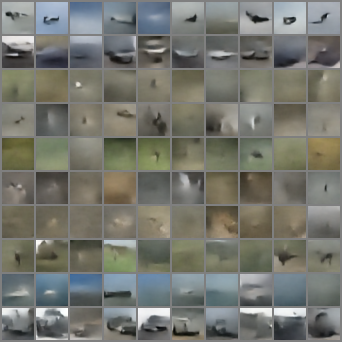

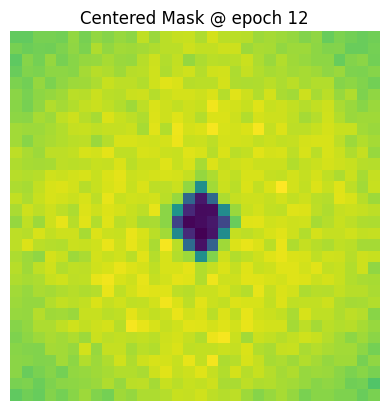

Epoch 12


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 12, iteration: 0, loss: 0.0445065
Epoch: 12, iteration: 50, loss: 0.0453549
Epoch: 12, iteration: 100, loss: 0.0475255
Epoch: 12, iteration: 150, loss: 0.0456337
Epoch: 12, iteration: 200, loss: 0.0425257
Epoch: 12, iteration: 250, loss: 0.0540394
Epoch: 12, iteration: 300, loss: 0.0412102
Epoch: 12, iteration: 350, loss: 0.0412363
Epoch: 12, iteration: 400, loss: 0.0412191
Epoch: 12, iteration: 450, loss: 0.0453339
Epoch 13


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 13, iteration: 0, loss: 0.0422966
Epoch: 13, iteration: 50, loss: 0.0430108
Epoch: 13, iteration: 100, loss: 0.049092
Epoch: 13, iteration: 150, loss: 0.046307
Epoch: 13, iteration: 200, loss: 0.0485704
Epoch: 13, iteration: 250, loss: 0.0428771
Epoch: 13, iteration: 300, loss: 0.0422889
Epoch: 13, iteration: 350, loss: 0.045274
Epoch: 13, iteration: 400, loss: 0.0450926
Epoch: 13, iteration: 450, loss: 0.0442038

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 14, loss: 0.0420918

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

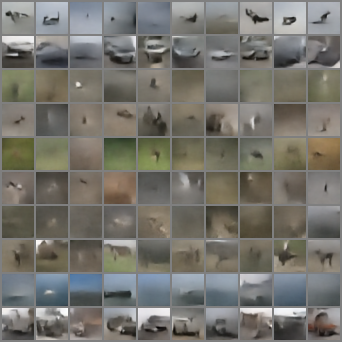

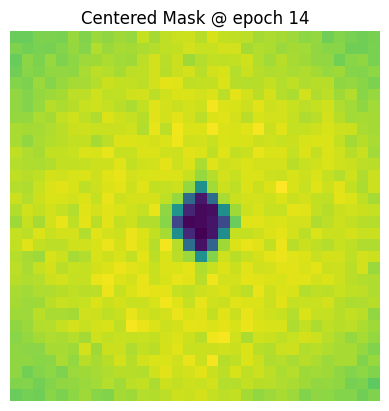

Epoch 14


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 14, iteration: 0, loss: 0.0483033
Epoch: 14, iteration: 50, loss: 0.0508196
Epoch: 14, iteration: 100, loss: 0.0458512
Epoch: 14, iteration: 150, loss: 0.0429021
Epoch: 14, iteration: 200, loss: 0.0467181
Epoch: 14, iteration: 250, loss: 0.0481503
Epoch: 14, iteration: 300, loss: 0.0386351
Epoch: 14, iteration: 350, loss: 0.0417362
Epoch: 14, iteration: 400, loss: 0.0374915
Epoch: 14, iteration: 450, loss: 0.0481377
Epoch 15


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 15, iteration: 0, loss: 0.0431297
Epoch: 15, iteration: 50, loss: 0.0477396
Epoch: 15, iteration: 100, loss: 0.0415035
Epoch: 15, iteration: 150, loss: 0.0521796
Epoch: 15, iteration: 200, loss: 0.0434789
Epoch: 15, iteration: 250, loss: 0.0488013
Epoch: 15, iteration: 300, loss: 0.0455863
Epoch: 15, iteration: 350, loss: 0.0488476
Epoch: 15, iteration: 400, loss: 0.0465249
Epoch: 15, iteration: 450, loss: 0.0415353

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 16, loss: 0.0416389

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

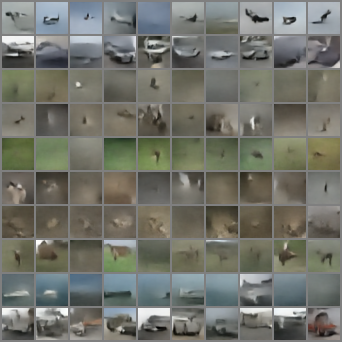

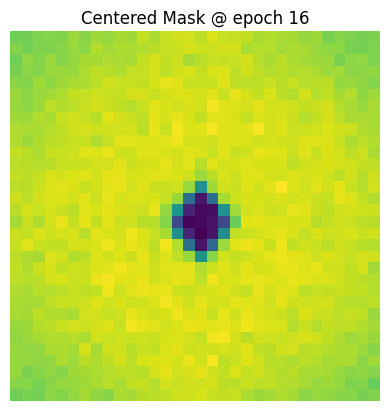

Epoch 16


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 16, iteration: 0, loss: 0.0404809
Epoch: 16, iteration: 50, loss: 0.0475923
Epoch: 16, iteration: 100, loss: 0.0413554
Epoch: 16, iteration: 150, loss: 0.0464554
Epoch: 16, iteration: 200, loss: 0.0414671
Epoch: 16, iteration: 250, loss: 0.0403935
Epoch: 16, iteration: 300, loss: 0.0477232
Epoch: 16, iteration: 350, loss: 0.040991
Epoch: 16, iteration: 400, loss: 0.0482768
Epoch: 16, iteration: 450, loss: 0.0472047
Epoch 17


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 17, iteration: 0, loss: 0.0459764
Epoch: 17, iteration: 50, loss: 0.0402643
Epoch: 17, iteration: 100, loss: 0.0455826
Epoch: 17, iteration: 150, loss: 0.0417833
Epoch: 17, iteration: 200, loss: 0.0480062
Epoch: 17, iteration: 250, loss: 0.0438763
Epoch: 17, iteration: 300, loss: 0.0422198
Epoch: 17, iteration: 350, loss: 0.0472236
Epoch: 17, iteration: 400, loss: 0.0382757
Epoch: 17, iteration: 450, loss: 0.038687

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 18, loss: 0.0412244

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

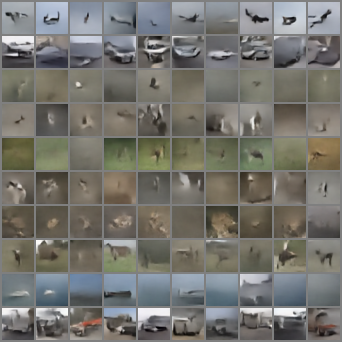

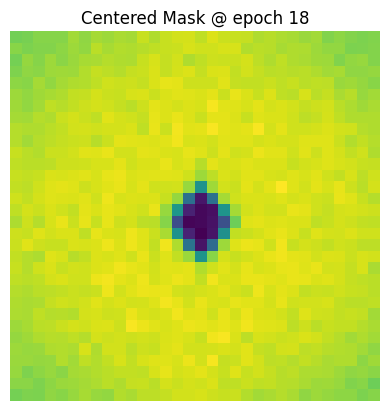

Epoch 18


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 18, iteration: 0, loss: 0.0361212
Epoch: 18, iteration: 50, loss: 0.0485847
Epoch: 18, iteration: 100, loss: 0.0439915
Epoch: 18, iteration: 150, loss: 0.0485451
Epoch: 18, iteration: 200, loss: 0.0410799
Epoch: 18, iteration: 250, loss: 0.0480185
Epoch: 18, iteration: 300, loss: 0.0408769
Epoch: 18, iteration: 350, loss: 0.047313
Epoch: 18, iteration: 400, loss: 0.0440903
Epoch: 18, iteration: 450, loss: 0.0459277
Epoch 19


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 19, iteration: 0, loss: 0.0402266
Epoch: 19, iteration: 50, loss: 0.0395311
Epoch: 19, iteration: 100, loss: 0.0409753
Epoch: 19, iteration: 150, loss: 0.0526627
Epoch: 19, iteration: 200, loss: 0.036554
Epoch: 19, iteration: 250, loss: 0.0378622
Epoch: 19, iteration: 300, loss: 0.0408885
Epoch: 19, iteration: 350, loss: 0.0433949
Epoch: 19, iteration: 400, loss: 0.0397108
Epoch: 19, iteration: 450, loss: 0.045471

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 20, loss: 0.0408652

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

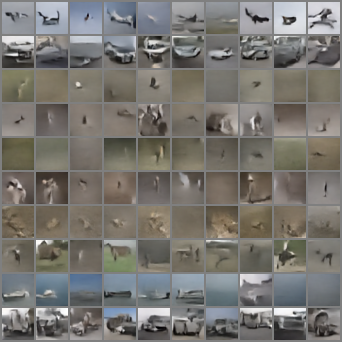

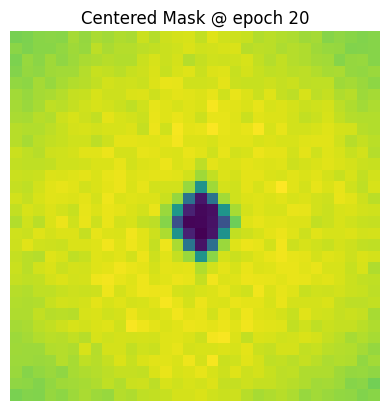

Epoch 20


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 20, iteration: 0, loss: 0.0455815
Epoch: 20, iteration: 50, loss: 0.0477329
Epoch: 20, iteration: 100, loss: 0.0459095
Epoch: 20, iteration: 150, loss: 0.0419241
Epoch: 20, iteration: 200, loss: 0.038044
Epoch: 20, iteration: 250, loss: 0.0431066
Epoch: 20, iteration: 300, loss: 0.0490031
Epoch: 20, iteration: 350, loss: 0.0423163
Epoch: 20, iteration: 400, loss: 0.0433918
Epoch: 20, iteration: 450, loss: 0.0427267
Epoch 21


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 21, iteration: 0, loss: 0.0369838
Epoch: 21, iteration: 50, loss: 0.0395767
Epoch: 21, iteration: 100, loss: 0.037354
Epoch: 21, iteration: 150, loss: 0.0481777
Epoch: 21, iteration: 200, loss: 0.0443567
Epoch: 21, iteration: 250, loss: 0.0407731
Epoch: 21, iteration: 300, loss: 0.0380163
Epoch: 21, iteration: 350, loss: 0.0492603
Epoch: 21, iteration: 400, loss: 0.0412334
Epoch: 21, iteration: 450, loss: 0.0477269

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 22, loss: 0.0403611

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

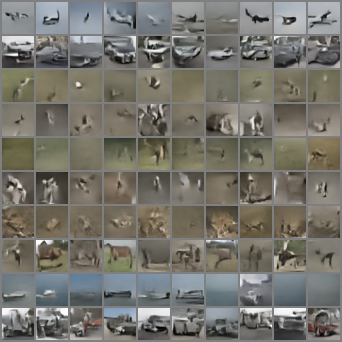

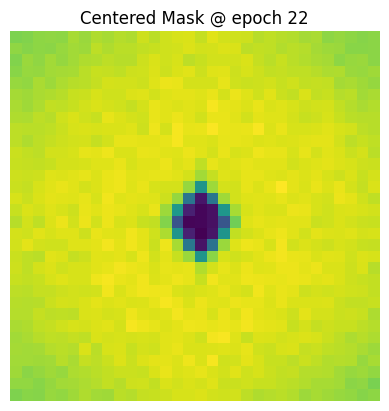

Epoch 22


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 22, iteration: 0, loss: 0.0360712
Epoch: 22, iteration: 50, loss: 0.0466683
Epoch: 22, iteration: 100, loss: 0.0437719
Epoch: 22, iteration: 150, loss: 0.0398268
Epoch: 22, iteration: 200, loss: 0.0408902
Epoch: 22, iteration: 250, loss: 0.0441288
Epoch: 22, iteration: 300, loss: 0.037012
Epoch: 22, iteration: 350, loss: 0.0408229
Epoch: 22, iteration: 400, loss: 0.0424174
Epoch: 22, iteration: 450, loss: 0.0402009
Epoch 23


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 23, iteration: 0, loss: 0.043208
Epoch: 23, iteration: 50, loss: 0.0436659
Epoch: 23, iteration: 100, loss: 0.0440169
Epoch: 23, iteration: 150, loss: 0.0393893
Epoch: 23, iteration: 200, loss: 0.0425398
Epoch: 23, iteration: 250, loss: 0.04892
Epoch: 23, iteration: 300, loss: 0.047747
Epoch: 23, iteration: 350, loss: 0.0390094
Epoch: 23, iteration: 400, loss: 0.0463267
Epoch: 23, iteration: 450, loss: 0.0420561

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 24, loss: 0.0400964

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

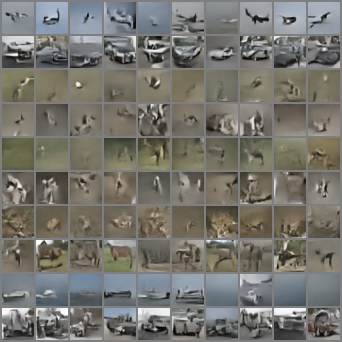

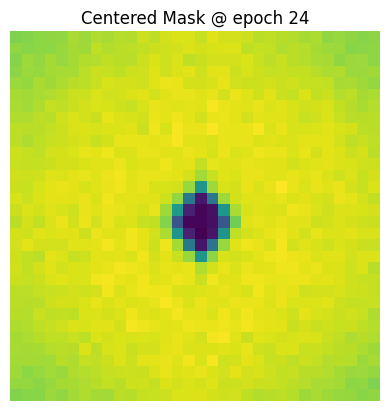

Epoch 24


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 24, iteration: 0, loss: 0.0418756
Epoch: 24, iteration: 50, loss: 0.0432595
Epoch: 24, iteration: 100, loss: 0.0389014
Epoch: 24, iteration: 150, loss: 0.0420621
Epoch: 24, iteration: 200, loss: 0.039373
Epoch: 24, iteration: 250, loss: 0.0462193
Epoch: 24, iteration: 300, loss: 0.0435054
Epoch: 24, iteration: 350, loss: 0.0420012
Epoch: 24, iteration: 400, loss: 0.0423674
Epoch: 24, iteration: 450, loss: 0.0463731
Epoch 25


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 25, iteration: 0, loss: 0.0414749
Epoch: 25, iteration: 50, loss: 0.0472858
Epoch: 25, iteration: 100, loss: 0.0444898
Epoch: 25, iteration: 150, loss: 0.0521478
Epoch: 25, iteration: 200, loss: 0.0417149
Epoch: 25, iteration: 250, loss: 0.0369006
Epoch: 25, iteration: 300, loss: 0.038322
Epoch: 25, iteration: 350, loss: 0.0400189
Epoch: 25, iteration: 400, loss: 0.0388388
Epoch: 25, iteration: 450, loss: 0.0408073

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 26, loss: 0.0398784

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

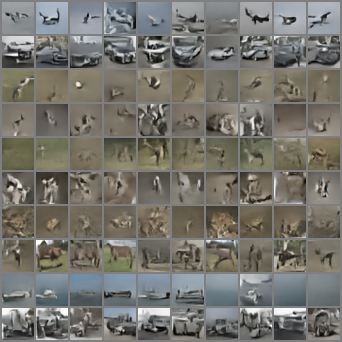

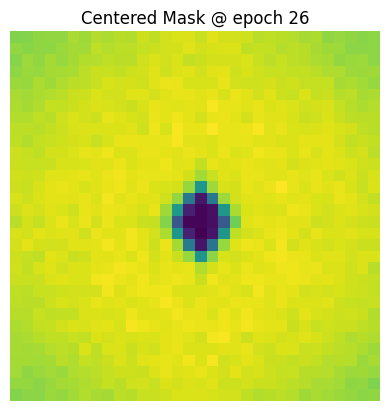

Epoch 26


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 26, iteration: 0, loss: 0.0377053
Epoch: 26, iteration: 50, loss: 0.0450916
Epoch: 26, iteration: 100, loss: 0.0456065
Epoch: 26, iteration: 150, loss: 0.0428348
Epoch: 26, iteration: 200, loss: 0.0453546
Epoch: 26, iteration: 250, loss: 0.043454
Epoch: 26, iteration: 300, loss: 0.0390447
Epoch: 26, iteration: 350, loss: 0.0446428
Epoch: 26, iteration: 400, loss: 0.0432075
Epoch: 26, iteration: 450, loss: 0.0486028
Epoch 27


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 27, iteration: 0, loss: 0.0443249
Epoch: 27, iteration: 50, loss: 0.0432859
Epoch: 27, iteration: 100, loss: 0.0417765
Epoch: 27, iteration: 150, loss: 0.0393543
Epoch: 27, iteration: 200, loss: 0.0350753
Epoch: 27, iteration: 250, loss: 0.039247
Epoch: 27, iteration: 300, loss: 0.0395618
Epoch: 27, iteration: 350, loss: 0.0452072
Epoch: 27, iteration: 400, loss: 0.0410681
Epoch: 27, iteration: 450, loss: 0.0447009

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 28, loss: 0.0396555

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

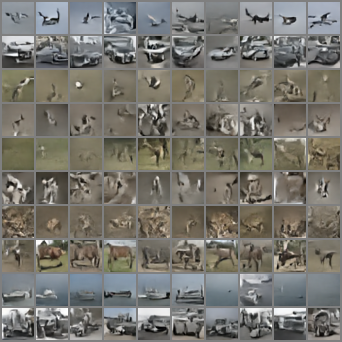

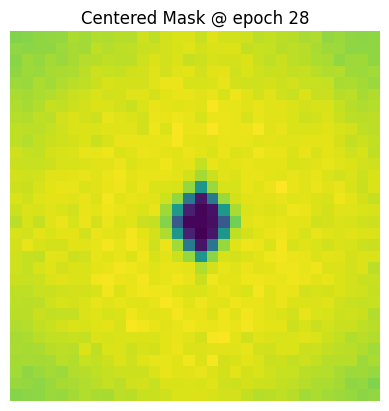

Epoch 28


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 28, iteration: 0, loss: 0.0378098
Epoch: 28, iteration: 50, loss: 0.0461108
Epoch: 28, iteration: 100, loss: 0.0387274
Epoch: 28, iteration: 150, loss: 0.0422445
Epoch: 28, iteration: 200, loss: 0.0364627
Epoch: 28, iteration: 250, loss: 0.0508094
Epoch: 28, iteration: 300, loss: 0.0449072
Epoch: 28, iteration: 350, loss: 0.0407624
Epoch: 28, iteration: 400, loss: 0.0392247
Epoch: 28, iteration: 450, loss: 0.0421072
Epoch 29


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 29, iteration: 0, loss: 0.0343149
Epoch: 29, iteration: 50, loss: 0.0374807
Epoch: 29, iteration: 100, loss: 0.0393073
Epoch: 29, iteration: 150, loss: 0.0411475
Epoch: 29, iteration: 200, loss: 0.0463057
Epoch: 29, iteration: 250, loss: 0.0394152
Epoch: 29, iteration: 300, loss: 0.0455097
Epoch: 29, iteration: 350, loss: 0.0414199
Epoch: 29, iteration: 400, loss: 0.0418227
Epoch: 29, iteration: 450, loss: 0.0389879

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 30, loss: 0.0393782

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

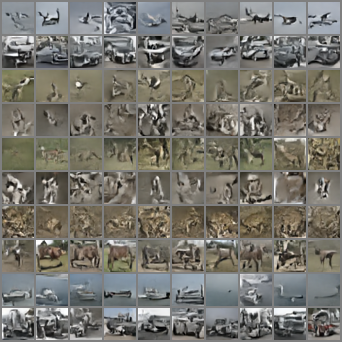

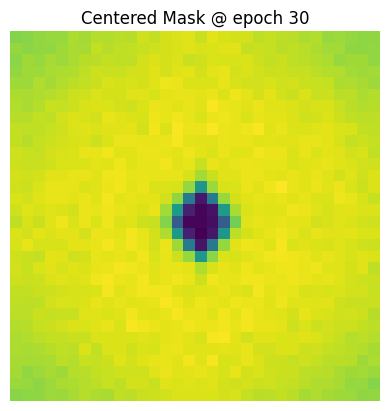

Epoch 30


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 30, iteration: 0, loss: 0.0410038
Epoch: 30, iteration: 50, loss: 0.0390572
Epoch: 30, iteration: 100, loss: 0.0415985
Epoch: 30, iteration: 150, loss: 0.0351508
Epoch: 30, iteration: 200, loss: 0.0404421
Epoch: 30, iteration: 250, loss: 0.0390248
Epoch: 30, iteration: 300, loss: 0.0371803
Epoch: 30, iteration: 350, loss: 0.0385168
Epoch: 30, iteration: 400, loss: 0.0388269
Epoch: 30, iteration: 450, loss: 0.0447733
Epoch 31


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 31, iteration: 0, loss: 0.0419599
Epoch: 31, iteration: 50, loss: 0.043231
Epoch: 31, iteration: 100, loss: 0.0437083
Epoch: 31, iteration: 150, loss: 0.0434613
Epoch: 31, iteration: 200, loss: 0.0387766
Epoch: 31, iteration: 250, loss: 0.0390281
Epoch: 31, iteration: 300, loss: 0.043729
Epoch: 31, iteration: 350, loss: 0.0468036
Epoch: 31, iteration: 400, loss: 0.0423256
Epoch: 31, iteration: 450, loss: 0.0341553

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 32, loss: 0.039142

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

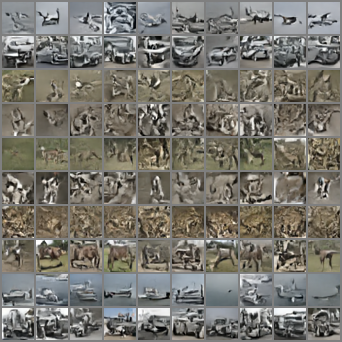

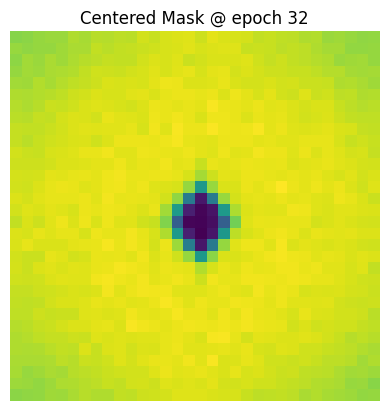

Epoch 32


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 32, iteration: 0, loss: 0.0401039
Epoch: 32, iteration: 50, loss: 0.0417215
Epoch: 32, iteration: 100, loss: 0.0382191
Epoch: 32, iteration: 150, loss: 0.0373484
Epoch: 32, iteration: 200, loss: 0.0386659
Epoch: 32, iteration: 250, loss: 0.041543
Epoch: 32, iteration: 300, loss: 0.0474578
Epoch: 32, iteration: 350, loss: 0.03917
Epoch: 32, iteration: 400, loss: 0.0425588
Epoch: 32, iteration: 450, loss: 0.0449224
Epoch 33


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 33, iteration: 0, loss: 0.042239
Epoch: 33, iteration: 50, loss: 0.041844
Epoch: 33, iteration: 100, loss: 0.040413
Epoch: 33, iteration: 150, loss: 0.041619
Epoch: 33, iteration: 200, loss: 0.0402966
Epoch: 33, iteration: 250, loss: 0.0360336
Epoch: 33, iteration: 300, loss: 0.0407043
Epoch: 33, iteration: 350, loss: 0.0400214
Epoch: 33, iteration: 400, loss: 0.0364375
Epoch: 33, iteration: 450, loss: 0.0427617

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 34, loss: 0.0388676

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

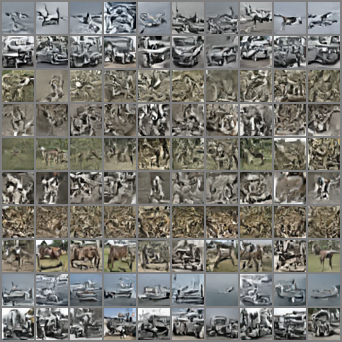

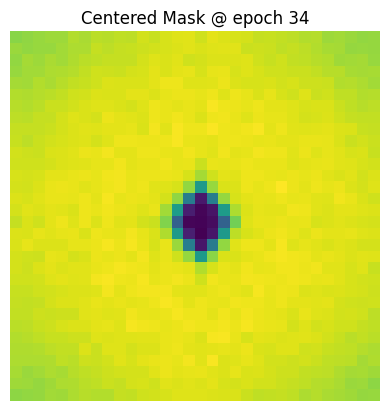

Epoch 34


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 34, iteration: 0, loss: 0.0401673
Epoch: 34, iteration: 50, loss: 0.0461331
Epoch: 34, iteration: 100, loss: 0.0397146
Epoch: 34, iteration: 150, loss: 0.0451826
Epoch: 34, iteration: 200, loss: 0.0426688
Epoch: 34, iteration: 250, loss: 0.0451172
Epoch: 34, iteration: 300, loss: 0.0401067
Epoch: 34, iteration: 350, loss: 0.0477618
Epoch: 34, iteration: 400, loss: 0.0406844
Epoch: 34, iteration: 450, loss: 0.0415867
Epoch 35


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 35, iteration: 0, loss: 0.0380385
Epoch: 35, iteration: 50, loss: 0.0385626
Epoch: 35, iteration: 100, loss: 0.0362583
Epoch: 35, iteration: 150, loss: 0.0468615
Epoch: 35, iteration: 200, loss: 0.0389697
Epoch: 35, iteration: 250, loss: 0.0390452
Epoch: 35, iteration: 300, loss: 0.0405282
Epoch: 35, iteration: 350, loss: 0.0390281
Epoch: 35, iteration: 400, loss: 0.0432039
Epoch: 35, iteration: 450, loss: 0.0399915

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 36, loss: 0.0386412

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

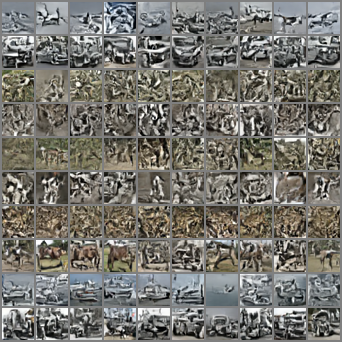

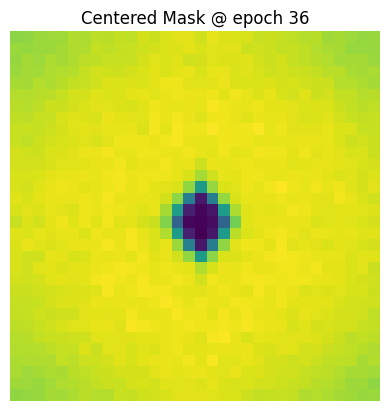

Epoch 36


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 36, iteration: 0, loss: 0.0435999
Epoch: 36, iteration: 50, loss: 0.0388254
Epoch: 36, iteration: 100, loss: 0.0414065
Epoch: 36, iteration: 150, loss: 0.0414905
Epoch: 36, iteration: 200, loss: 0.0449983
Epoch: 36, iteration: 250, loss: 0.0433963
Epoch: 36, iteration: 300, loss: 0.040113
Epoch: 36, iteration: 350, loss: 0.0395443
Epoch: 36, iteration: 400, loss: 0.042243
Epoch: 36, iteration: 450, loss: 0.042583
Epoch 37


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 37, iteration: 0, loss: 0.0351167
Epoch: 37, iteration: 50, loss: 0.0433837
Epoch: 37, iteration: 100, loss: 0.0363877
Epoch: 37, iteration: 150, loss: 0.0446999
Epoch: 37, iteration: 200, loss: 0.0372821
Epoch: 37, iteration: 250, loss: 0.0403188
Epoch: 37, iteration: 300, loss: 0.0405682
Epoch: 37, iteration: 350, loss: 0.0454436
Epoch: 37, iteration: 400, loss: 0.0376333
Epoch: 37, iteration: 450, loss: 0.0445652

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 38, loss: 0.0384626

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

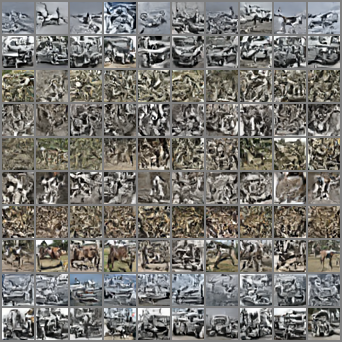

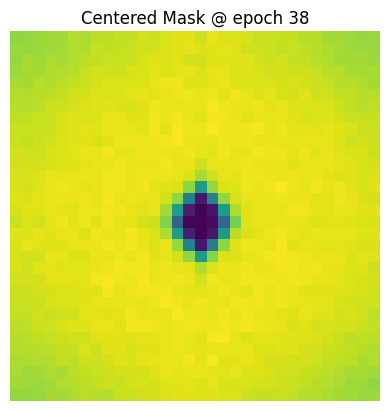

Epoch 38


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 38, iteration: 0, loss: 0.0437314
Epoch: 38, iteration: 50, loss: 0.0456196
Epoch: 38, iteration: 100, loss: 0.0355184
Epoch: 38, iteration: 150, loss: 0.0371696
Epoch: 38, iteration: 200, loss: 0.0367635
Epoch: 38, iteration: 250, loss: 0.039794
Epoch: 38, iteration: 300, loss: 0.0347709
Epoch: 38, iteration: 350, loss: 0.0364948
Epoch: 38, iteration: 400, loss: 0.0373663
Epoch: 38, iteration: 450, loss: 0.0391128
Epoch 39


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 39, iteration: 0, loss: 0.040893
Epoch: 39, iteration: 50, loss: 0.0384144
Epoch: 39, iteration: 100, loss: 0.0417735
Epoch: 39, iteration: 150, loss: 0.0410375
Epoch: 39, iteration: 200, loss: 0.0423048
Epoch: 39, iteration: 250, loss: 0.0430536
Epoch: 39, iteration: 300, loss: 0.0407403
Epoch: 39, iteration: 350, loss: 0.038219
Epoch: 39, iteration: 400, loss: 0.046481
Epoch: 39, iteration: 450, loss: 0.0374618

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 40, loss: 0.0383137

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

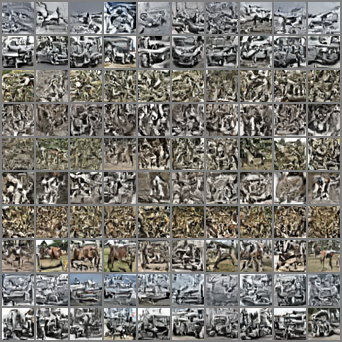

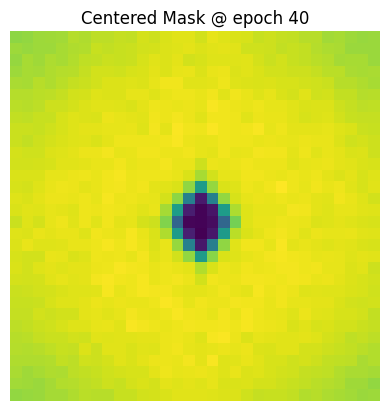

Epoch 40


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 40, iteration: 0, loss: 0.0375983
Epoch: 40, iteration: 50, loss: 0.0395902
Epoch: 40, iteration: 100, loss: 0.0343505
Epoch: 40, iteration: 150, loss: 0.0395149
Epoch: 40, iteration: 200, loss: 0.0346952
Epoch: 40, iteration: 250, loss: 0.0476776
Epoch: 40, iteration: 300, loss: 0.0426713
Epoch: 40, iteration: 350, loss: 0.0426646
Epoch: 40, iteration: 400, loss: 0.0418067
Epoch: 40, iteration: 450, loss: 0.0415911
Epoch 41


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 41, iteration: 0, loss: 0.0357917
Epoch: 41, iteration: 50, loss: 0.0400259
Epoch: 41, iteration: 100, loss: 0.0358593
Epoch: 41, iteration: 150, loss: 0.0417929
Epoch: 41, iteration: 200, loss: 0.0403649
Epoch: 41, iteration: 250, loss: 0.0381403
Epoch: 41, iteration: 300, loss: 0.0341112
Epoch: 41, iteration: 350, loss: 0.0350113
Epoch: 41, iteration: 400, loss: 0.0356555
Epoch: 41, iteration: 450, loss: 0.0376507

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 42, loss: 0.0381352

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

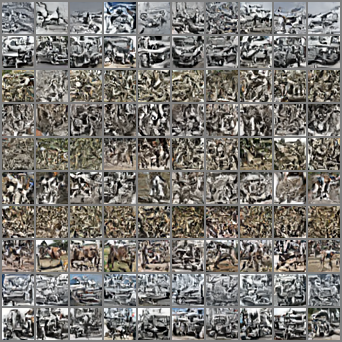

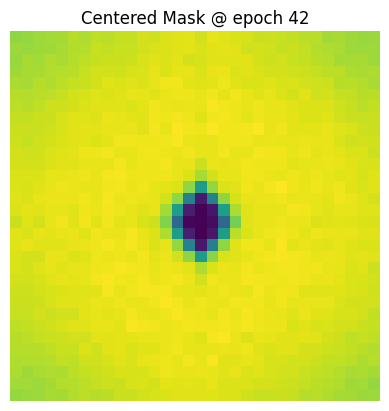

Epoch 42


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 42, iteration: 0, loss: 0.0364083
Epoch: 42, iteration: 50, loss: 0.0391775
Epoch: 42, iteration: 100, loss: 0.0413294
Epoch: 42, iteration: 150, loss: 0.0399767
Epoch: 42, iteration: 200, loss: 0.0420621
Epoch: 42, iteration: 250, loss: 0.0456353
Epoch: 42, iteration: 300, loss: 0.0431969
Epoch: 42, iteration: 350, loss: 0.0411889
Epoch: 42, iteration: 400, loss: 0.0368847
Epoch: 42, iteration: 450, loss: 0.0407955
Epoch 43


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 43, iteration: 0, loss: 0.041945
Epoch: 43, iteration: 50, loss: 0.0356734
Epoch: 43, iteration: 100, loss: 0.0357779
Epoch: 43, iteration: 150, loss: 0.0373025
Epoch: 43, iteration: 200, loss: 0.0355086
Epoch: 43, iteration: 250, loss: 0.0384216
Epoch: 43, iteration: 300, loss: 0.0406648
Epoch: 43, iteration: 350, loss: 0.0435285
Epoch: 43, iteration: 400, loss: 0.0384778
Epoch: 43, iteration: 450, loss: 0.0384288

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 44, loss: 0.037989

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

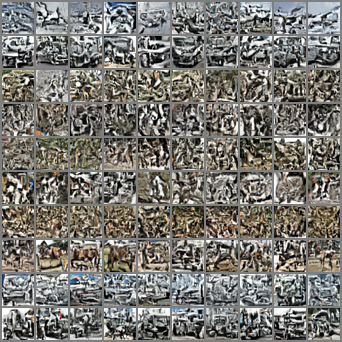

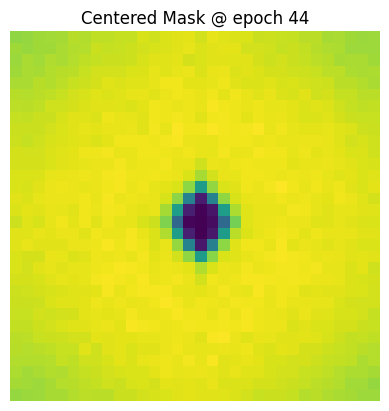

Epoch 44


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 44, iteration: 0, loss: 0.0453903
Epoch: 44, iteration: 50, loss: 0.0405768
Epoch: 44, iteration: 100, loss: 0.0386906
Epoch: 44, iteration: 150, loss: 0.0424437
Epoch: 44, iteration: 200, loss: 0.0364645
Epoch: 44, iteration: 250, loss: 0.0431732
Epoch: 44, iteration: 300, loss: 0.0400238
Epoch: 44, iteration: 350, loss: 0.0401352
Epoch: 44, iteration: 400, loss: 0.0337567
Epoch: 44, iteration: 450, loss: 0.0421647
Epoch 45


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 45, iteration: 0, loss: 0.0323937
Epoch: 45, iteration: 50, loss: 0.0379392
Epoch: 45, iteration: 100, loss: 0.0374686
Epoch: 45, iteration: 150, loss: 0.042557
Epoch: 45, iteration: 200, loss: 0.0430713
Epoch: 45, iteration: 250, loss: 0.0335294
Epoch: 45, iteration: 300, loss: 0.0383735
Epoch: 45, iteration: 350, loss: 0.0416196
Epoch: 45, iteration: 400, loss: 0.0441109
Epoch: 45, iteration: 450, loss: 0.0398406

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 46, loss: 0.0378732

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

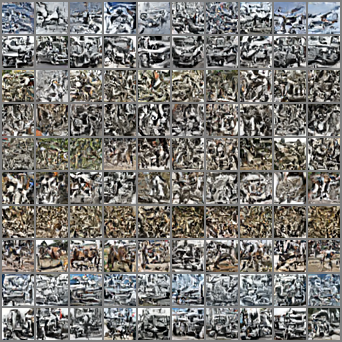

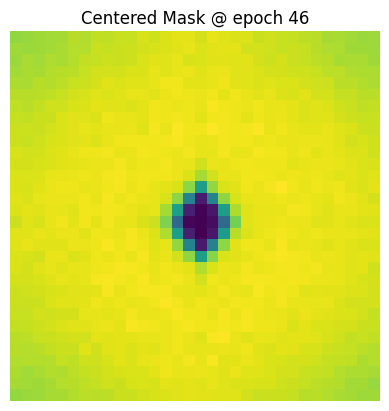

Epoch 46


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 46, iteration: 0, loss: 0.044968
Epoch: 46, iteration: 50, loss: 0.039704
Epoch: 46, iteration: 100, loss: 0.0391696
Epoch: 46, iteration: 150, loss: 0.0352286
Epoch: 46, iteration: 200, loss: 0.0329812
Epoch: 46, iteration: 250, loss: 0.0395004
Epoch: 46, iteration: 300, loss: 0.0362369
Epoch: 46, iteration: 350, loss: 0.0318901
Epoch: 46, iteration: 400, loss: 0.0337949
Epoch: 46, iteration: 450, loss: 0.0411305
Epoch 47


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 47, iteration: 0, loss: 0.0374376
Epoch: 47, iteration: 50, loss: 0.0402935
Epoch: 47, iteration: 100, loss: 0.0403795
Epoch: 47, iteration: 150, loss: 0.043357
Epoch: 47, iteration: 200, loss: 0.0388351
Epoch: 47, iteration: 250, loss: 0.0406688
Epoch: 47, iteration: 300, loss: 0.0391134
Epoch: 47, iteration: 350, loss: 0.0451102
Epoch: 47, iteration: 400, loss: 0.0368465
Epoch: 47, iteration: 450, loss: 0.0398128

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 48, loss: 0.0377438

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

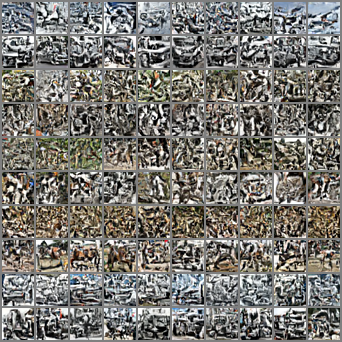

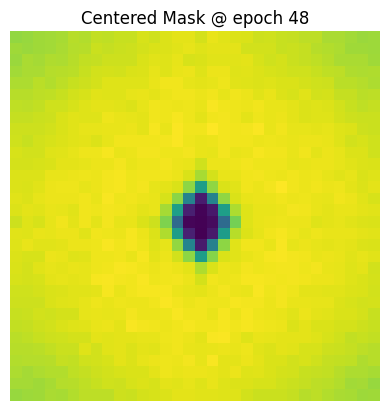

Epoch 48


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 48, iteration: 0, loss: 0.0362778
Epoch: 48, iteration: 50, loss: 0.0450176
Epoch: 48, iteration: 100, loss: 0.0357151
Epoch: 48, iteration: 150, loss: 0.0413129
Epoch: 48, iteration: 200, loss: 0.037272
Epoch: 48, iteration: 250, loss: 0.0352716
Epoch: 48, iteration: 300, loss: 0.0394852
Epoch: 48, iteration: 350, loss: 0.0371636
Epoch: 48, iteration: 400, loss: 0.0396363
Epoch: 48, iteration: 450, loss: 0.039198
Epoch 49


  0%|          | 0/500 [00:00<?, ?it/s]

Epoch: 49, iteration: 0, loss: 0.0400097
Epoch: 49, iteration: 50, loss: 0.0422589
Epoch: 49, iteration: 100, loss: 0.042964
Epoch: 49, iteration: 150, loss: 0.0416109
Epoch: 49, iteration: 200, loss: 0.0403815
Epoch: 49, iteration: 250, loss: 0.0375069
Epoch: 49, iteration: 300, loss: 0.0361404
Epoch: 49, iteration: 350, loss: 0.039234
Epoch: 49, iteration: 400, loss: 0.0355553
Epoch: 49, iteration: 450, loss: 0.041264

Validating...


  0%|          | 0/100 [00:00<?, ?it/s]

Validation: Epoch: 50, loss: 0.0375799

Sampling...


  0%|          | 0/500 [00:00<?, ?it/s]

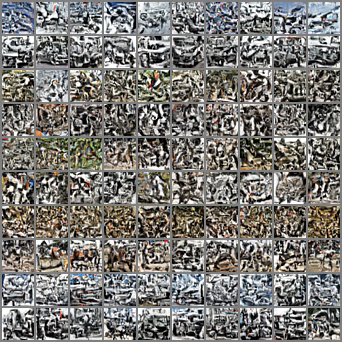

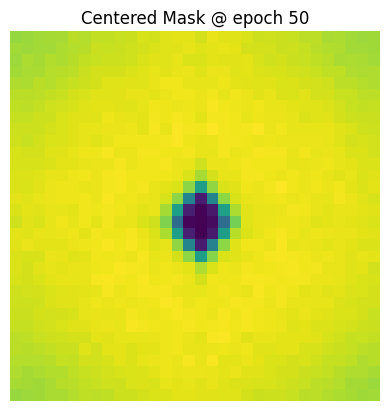

In [ ]:
# Actually train the model

ema_decay = 0.998

# The number of timesteps to use when sampling
steps = 500

NUM_EPOCHS = 50

# The amount of noise to add each timestep when sampling
# 0 = no noise (DDIM)
# 1 = full noise (DDPM)
eta = 1.

#Loss
train_loss_list = []
val_loss_list = []



def eval_loss(model, rng, reals, classes):
    B = reals.shape[0]
    t = rng.draw(B)[:, 0].to(device)
    log_snrs = get_ddpm_schedule(t)
    alphas, sigmas = get_alphas_sigmas(log_snrs)
    weights = log_snrs.exp() / log_snrs.exp().add(1)

    alphas_ = alphas[:, None, None, None]
    sigmas_ = sigmas[:, None, None, None]
    noise = torch.randn_like(reals)

    # Frequency masking (FFT domain)
    x0_freq = torch.fft.fft2(reals, norm='ortho')
    eps_freq = torch.fft.fft2(noise, norm='ortho')
    mask = torch.sigmoid(mask_param).expand(B, 1, 32, 32).to(reals.device)
    eps_freq = eps_freq * mask
    xt_freq = x0_freq * alphas_ + eps_freq * sigmas_
    xt = torch.fft.ifft2(xt_freq, norm='ortho').real  # [B, C, H, W]

    targets = noise * alphas_ - reals * sigmas_

    with torch.cuda.amp.autocast():
        v = model(xt, log_snrs, classes)
        return (v - targets).pow(2).mean([1, 2, 3]).mul(weights).mean()



def train():
    total_loss = 0
    count = 0
    for i, (reals, classes) in enumerate(tqdm(train_dl)):
        opt.zero_grad()
        reals = reals.to(device)
        classes = classes.to(device)

        loss = eval_loss(model, rng, reals, classes)

        scaler.scale(loss).backward()
        scaler.step(opt)
        ema_update(model, model_ema, 0.95 if epoch < 20 else ema_decay)
        scaler.update()

        total_loss += loss.item() * len(reals)
        count += len(reals)

        if i % 50 == 0:
            tqdm.write(f'Epoch: {epoch}, iteration: {i}, loss: {loss.item():g}')

    avg_loss = total_loss / count
    train_loss_list.append(avg_loss)



@torch.no_grad()
@torch.random.fork_rng()
@eval_mode(model_ema)
def val():
    tqdm.write('\nValidating...')
    torch.manual_seed(seed)
    rng = torch.quasirandom.SobolEngine(1, scramble=True)
    total_loss = 0
    count = 0
    for i, (reals, classes) in enumerate(tqdm(val_dl)):
        reals = reals.to(device)
        classes = classes.to(device)

        loss = eval_loss(model_ema, rng, reals, classes)
        total_loss += loss.item() * len(reals)
        count += len(reals)

    avg_loss = total_loss / count
    tqdm.write(f'Validation: Epoch: {epoch}, loss: {avg_loss:g}')
    return avg_loss



@torch.no_grad()
@torch.random.fork_rng()
@eval_mode(model_ema)
def demo():
    tqdm.write('\nSampling...')
    torch.manual_seed(seed)

    noise = torch.randn([100, 3, 32, 32], device=device)
    fakes_classes = torch.arange(10, device=device).repeat_interleave(10, 0)
    fakes = sample(model_ema, noise, steps, eta, fakes_classes, mask_param=mask_param)

    grid = utils.make_grid(fakes, 10).cpu()
    filename = f'demo_{epoch:05}.png'
    TF.to_pil_image(grid.add(1).div(2).clamp(0, 1)).save(filename)
    display.display(display.Image(filename))
    tqdm.write('')


def save():
    filename = 'cifar_diffusion.pth'
    obj = {
        'model': model.state_dict(),
        'model_ema': model_ema.state_dict(),
        'opt': opt.state_dict(),
        'scaler': scaler.state_dict(),
        'epoch': epoch,
        'mask_param': mask_param.detach().cpu(),
    }
    torch.save(obj, filename)


from torch.fft import fftshift

@torch.no_grad()
def visualize_mask(mask_param, epoch=0, save=False):
    import matplotlib.pyplot as plt
    from torch.fft import fftshift

    mask = mask_param[0, 0].detach().cpu()
    mask = fftshift(mask)

    plt.imshow(mask.numpy(), cmap='viridis')
    plt.title(f"Centered Mask @ epoch {epoch}")
    plt.axis('off')
    if save:
        plt.savefig(f"mask_epoch_{epoch:03}.png")
    else:
        plt.show()
    plt.close()



try:
    val_loss = val()
    val_loss_list.append(val_loss)
    demo()
    visualize_mask(mask_param, epoch=epoch, save=False)

    while epoch < NUM_EPOCHS:
        print('Epoch', epoch)
        train()
        epoch += 1

        if epoch % 2 == 0 or epoch == 1:
            val_loss = val()
            val_loss_list.append(val_loss)
            demo()
            visualize_mask(mask_param, epoch=epoch, save=False)

        save()
        torch.save(mask_param.detach().cpu(), f"mask_epoch_{epoch:03}.pt")
except KeyboardInterrupt:
    pass



Sample Generation

In [ ]:
@torch.no_grad()
@eval_mode(model_ema)
def generate_and_save_samples(save_path='sample_grid.png', rows=8, cols=8):
    model_ema.eval()

    num_samples = rows * cols
    classes = torch.randint(0, 10, (num_samples,), device=device)
    noise = torch.randn([num_samples, 3, 32, 32], device=device)

    # Sampling with frequency masking
    samples = sample(model_ema, noise, steps, eta, classes, mask_param=mask_param)
    samples = (samples.clamp(-1, 1) + 1) / 2

    import matplotlib.pyplot as plt
    fig, axes = plt.subplots(rows, cols, figsize=(cols, rows))
    for i in range(rows):
        for j in range(cols):
            idx = i * cols + j
            img = samples[idx].detach().cpu().permute(1, 2, 0).numpy()
            axes[i, j].imshow(img)
            axes[i, j].axis('off')
    plt.subplots_adjust(wspace=0.05, hspace=0.05)
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()


  0%|          | 0/500 [00:00<?, ?it/s]

<ipython-input-27-399176926>:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


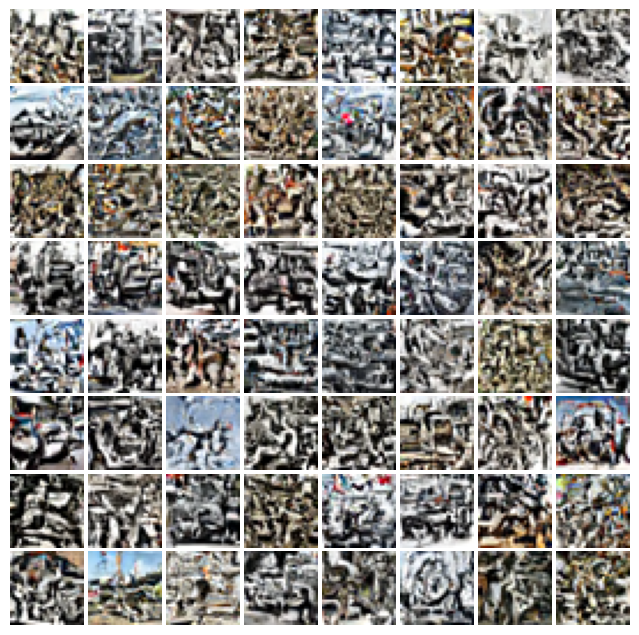

In [ ]:
generate_and_save_samples(save_path="cifar10_generated_small.png", rows=8, cols=8)

  0%|          | 0/500 [00:00<?, ?it/s]

<ipython-input-27-399176926>:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


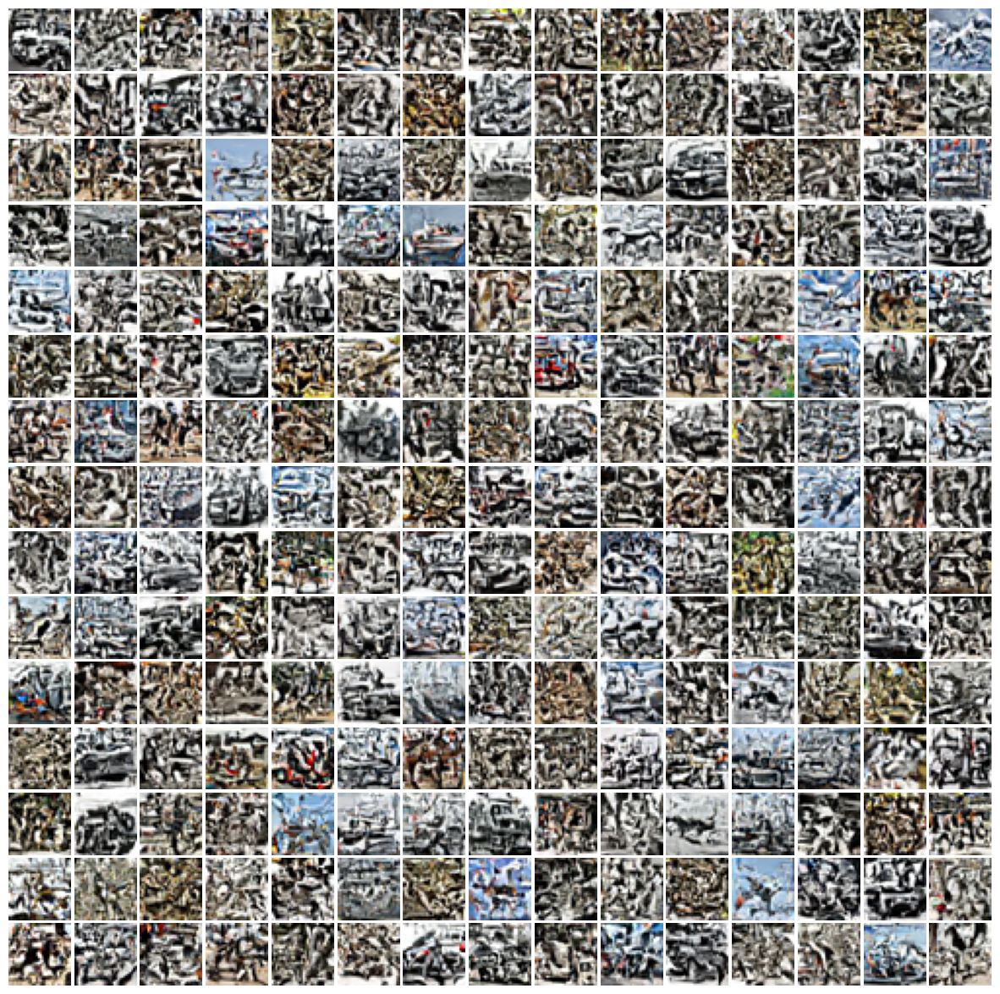

In [ ]:
generate_and_save_samples(save_path="cifar10_generated_large.png", rows=15, cols=15)


Reverse process Visualization

In [ ]:
@torch.no_grad()
@eval_mode(model_ema)
def visualize_reverse_trajectory_cifar(labels, total_steps=500, vis_steps=20, save_path=None, show=False):

    import matplotlib.pyplot as plt
    from tqdm import tqdm

    num_rows = len(labels)
    t = torch.linspace(1, 0, total_steps)
    log_snrs = get_ddpm_schedule(t.to(device))
    alphas, sigmas = get_alphas_sigmas(log_snrs)
    selected_idxs = torch.linspace(0, total_steps - 1, vis_steps).long().tolist()

    all_images = []

    for label in tqdm(labels, desc="Generating trajectories"):
        class_label = torch.tensor([label], device=device).repeat(1)
        x = torch.randn(1, 3, 32, 32, device=device)

        row_images = []
        for i in range(total_steps):
            ts = log_snrs[i].expand(1)
            v = model_ema(x, ts, class_label)

            pred = x * alphas[i] - v * sigmas[i]
            eps = x * sigmas[i] + v * alphas[i]

            if i < total_steps - 1:
                ddim_sigma = eta * (sigmas[i + 1]**2 / sigmas[i]**2).sqrt() * \
                             (1 - alphas[i]**2 / alphas[i + 1]**2).sqrt()
                adjusted_sigma = (sigmas[i + 1]**2 - ddim_sigma**2).sqrt()

                x = pred * alphas[i + 1] + eps * adjusted_sigma

                if eta > 0:
                    noise = torch.randn_like(x)
                    if mask_param is not None:
                        noise_fft = torch.fft.fft2(noise, norm='ortho')
                        mask = mask_param.to(noise.device).expand_as(noise_fft)
                        noise_fft = noise_fft * mask
                        noise = torch.fft.ifft2(noise_fft, norm='ortho').real
                    x += noise * ddim_sigma
            else:
                x = pred

            if i in selected_idxs:
                row_images.append((x.clamp(-1, 1) + 1) / 2)

        all_images.append(row_images)

    # 시각화
    fig, axes = plt.subplots(num_rows, vis_steps, figsize=(vis_steps, num_rows))
    for r in range(num_rows):
        for c in range(vis_steps):
            img = all_images[r][c][0].detach().cpu().permute(1, 2, 0).numpy()
            ax = axes[r, c] if num_rows > 1 else axes[c]
            ax.imshow(img)
            ax.set_xticks([])
            ax.set_yticks([])
            if r == num_rows - 1:
                ax.set_xlabel(f"T={selected_idxs[c]}", fontsize=6)
    plt.subplots_adjust(wspace=0.01, hspace=0.05)
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved to {save_path}")


    plt.show()

    plt.close()


Generating trajectories: 100%|██████████| 4/4 [00:13<00:00,  3.38s/it]


Saved to cifar_reverse_steps.png


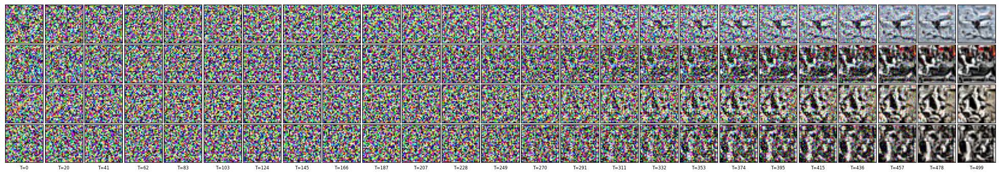

In [ ]:
visualize_reverse_trajectory_cifar(
    labels=[0, 1, 2, 3],
    total_steps=500,
    vis_steps=25,
    save_path="cifar_reverse_steps.png",
    show=False
)


Frequency Mask & Heatmap Visualization

✅ Saved mask evolution figure to mask_evolution_grid.png


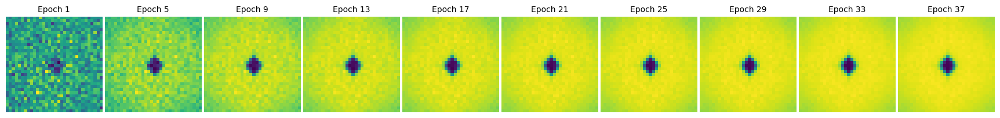

In [ ]:
import torch
import matplotlib.pyplot as plt
from torch.fft import fftshift
import os

def plot_mask_evolution(mask_dir, epoch_list, save_path='mask_evolution.png'):
    import torch
    import matplotlib.pyplot as plt
    from torch.fft import fftshift
    import os

    n = len(epoch_list)
    fig, axes = plt.subplots(1, n, figsize=(2.2 * n, 2.2))

    for i, epoch in enumerate(epoch_list):
        mask_file = os.path.join(mask_dir, f"mask_epoch_{epoch:03}.pt")
        if not os.path.exists(mask_file):
            print(f"File not found: {mask_file}")
            continue

        mask = torch.load(mask_file)[0, 0]
        mask = torch.sigmoid(mask)
        mask = fftshift(mask).numpy()

        ax = axes[i] if n > 1 else axes
        im = ax.imshow(mask, cmap='viridis')
        ax.set_title(f"Epoch {epoch}", fontsize=10)
        ax.axis('off')

    plt.subplots_adjust(wspace=0.03, hspace=0.01)
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


plot_mask_evolution(
    mask_dir='.',
    epoch_list=list(range(1, 41, 4)),
    save_path='mask_evolution_grid.png'
)


FID

In [ ]:
!pip install clean-fid

In [ ]:
import os
from torchvision.utils import save_image

@torch.no_grad()
@eval_mode(model_ema)
def generate_many_samples(output_dir='fid_fake_images', total=1000, batch_size=100, mask_param=None):
    """
    Generates diffusion samples using model_ema and saves them as images.

    Args:
        output_dir (str): Directory to save images.
        total (int): Total number of images to generate.
        batch_size (int): Images per batch.
        mask_param (torch.Tensor): Learnable frequency mask to apply in sampling.
    """
    os.makedirs(output_dir, exist_ok=True)
    model_ema.eval()

    for i in range(0, total, batch_size):
        noise = torch.randn([batch_size, 3, 32, 32], device=device)
        classes = torch.randint(0, 10, (batch_size,), device=device)

        samples = sample(model_ema, noise, steps, eta, classes, mask_param=mask_param)
        samples = (samples.clamp(-1, 1) + 1) / 2  # [-1,1] → [0,1]

        for j in range(samples.size(0)):
            save_image(samples[j], os.path.join(output_dir, f"sample_{i+j:05}.png"))


In [ ]:
from torchvision.datasets import CIFAR10
from torchvision.utils import save_image
import os

def save_cifar10_real_images(output_dir="fid_real_images", total=1000):
    os.makedirs(output_dir, exist_ok=True)
    dataset = CIFAR10(root=".", train=False, download=True)
    for i in range(total):
        img, _ = dataset[i]
        save_image((transforms.ToTensor()(img)), f"{output_dir}/real_{i:05}.png")


In [ ]:
from cleanfid import fid
generate_many_samples(output_dir="fid_fake_images", total=10000, batch_size=100, mask_param=mask_param)
save_cifar10_real_images(output_dir='fid_real_images', total=10000)


# CIFAR-10 real stats
fid_score = fid.compute_fid("fid_fake_images", "fid_real_images")
print(f"FID score: {fid_score:.2f}")


  0%|          | 0/500 [00:00<?, ?it/s]

<ipython-input-6-399176926>:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

100%|██████████| 170M/170M [00:04<00:00, 35.0MB/s]
/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 12 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


compute FID between two folders
Found 10000 images in the folder fid_fake_images


FID fid_fake_images : 100%|██████████| 313/313 [00:56<00:00,  5.55it/s]


Found 10000 images in the folder fid_real_images


FID fid_real_images : 100%|██████████| 313/313 [00:56<00:00,  5.57it/s]


FID score: 236.59


In [ ]:
print(f"Exact FID score: {fid_score:.10f}")


Exact FID score: 236.5949214632


In [ ]:
import shutil

shutil.rmtree("fid_fake_images")
shutil.rmtree("fid_real_images")
print("Temporary folders deleted.")

Temporary folders deleted.
